In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

In [3]:
df = pd.read_csv("data.csv")
df.head()

,Age,Gender,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Interest,Personality
0,21.0,Female,1,5.89208,2.144395,7.32363,5.462224,Arts,ENTP
1,24.0,Female,1,2.48366,3.206188,8.06876,3.765012,Unknown,INTP
2,26.0,Female,1,7.02910,6.469302,4.16472,5.454442,Others,ESFP
3,30.0,Male,0,5.46525,4.179244,2.82487,5.080477,Sports,ENFJ
4,31.0,Female,0,3.59804,6.189259,5.31347,3.677984,Others,ISFP


In [5]:
y = df["Personality"]

In [7]:
x = df.drop("Personality", axis=1)
x.head()

,Age,Gender,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Interest
0,21.0,Female,1,5.89208,2.144395,7.32363,5.462224,Arts
1,24.0,Female,1,2.48366,3.206188,8.06876,3.765012,Unknown
2,26.0,Female,1,7.02910,6.469302,4.16472,5.454442,Others
3,30.0,Male,0,5.46525,4.179244,2.82487,5.080477,Sports
4,31.0,Female,0,3.59804,6.189259,5.31347,3.677984,Others


In [11]:
x2 = pd.get_dummies(x)
x2.head()

,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Gender_Female,Gender_Male,Interest_Arts,Interest_Others,Interest_Sports,Interest_Technology,Interest_Unknown
0,21.0,1,5.89208,2.144395,7.32363,5.462224,True,False,True,False,False,False,False
1,24.0,1,2.48366,3.206188,8.06876,3.765012,True,False,False,False,False,False,True
2,26.0,1,7.02910,6.469302,4.16472,5.454442,True,False,False,True,False,False,False
3,30.0,0,5.46525,4.179244,2.82487,5.080477,False,True,False,False,True,False,False
4,31.0,0,3.59804,6.189259,5.31347,3.677984,True,False,False,True,False,False,False


In [13]:
x2 = x2.drop(["Gender_Female"], axis=1)
x2.head()

,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Gender_Male,Interest_Arts,Interest_Others,Interest_Sports,Interest_Technology,Interest_Unknown
0,21.0,1,5.89208,2.144395,7.32363,5.462224,False,True,False,False,False,False
1,24.0,1,2.48366,3.206188,8.06876,3.765012,False,False,False,False,False,True
2,26.0,1,7.02910,6.469302,4.16472,5.454442,False,False,True,False,False,False
3,30.0,0,5.46525,4.179244,2.82487,5.080477,True,False,False,True,False,False
4,31.0,0,3.59804,6.189259,5.31347,3.677984,False,False,True,False,False,False


In [15]:
from lightgbm import LGBMClassifier

In [17]:
y_val = y.values

In [19]:
list(set(y_val))

['ISFP',
 'ISTP',
 'INTP',
 'ENTP',
 'INFJ',
 'ESTP',
 'ESFP',
 'ENFJ',
 'INFP',
 'INTJ',
 'ISTJ',
 'ENFP',
 'ESFJ',
 'ISFJ',
 'ENTJ',
 'ESTJ']

In [21]:
dic = {}
for i in range(len(list(set(y_val)))):
    dic[list(set(y_val))[i]] = i
dic

{'ISFP': 0,
 'ISTP': 1,
 'INTP': 2,
 'ENTP': 3,
 'INFJ': 4,
 'ESTP': 5,
 'ESFP': 6,
 'ENFJ': 7,
 'INFP': 8,
 'INTJ': 9,
 'ISTJ': 10,
 'ENFP': 11,
 'ESFJ': 12,
 'ISFJ': 13,
 'ENTJ': 14,
 'ESTJ': 15}

In [25]:
y_val2 = []
for i in range(len(y_val)):
    y_val2.append(dic[y_val[i]])
y2 = pd.DataFrame(y_val2)
y2.columns = ["Personality"]
y2.head()

,Personality
0,3
1,2
2,6
3,7
4,0


In [27]:
model = LGBMClassifier()
model.fit(x2, y2)

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43744, number of used features: 12
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start training from score -2.772589
[LightGBM] [Info] Start tra

LGBMClassifier()

In [41]:
df_imp = pd.DataFrame(model.feature_importances_/sum(model.feature_importances_))
df_imp.index = x2.columns
df_imp.columns = ["imp"]
df_imp.sort_values("imp", ascending=False)

,imp
Thinking Score,0.199917
Judging Score,0.196146
Introversion Score,0.186438
Sensing Score,0.175604
Age,0.105313
Gender_Male,0.034042
Education,0.032250
Interest_Arts,0.023229
Interest_Sports,0.020646
Interest_Unknown,0.011729


In [43]:
df.describe()

,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score
count,43744.000000,43744.000000,43744.000000,43744.000000,43744.000000,43744.000000
mean,27.437203,0.229014,4.588349,5.780074,5.419131,5.391041
std,4.893805,0.420203,2.902628,1.241648,2.900785,1.442413
min,18.000000,0.000000,0.000150,0.000000,0.000320,0.000000
25%,24.000000,0.000000,2.067020,4.953340,2.895750,4.511842
50%,27.000000,0.000000,4.261680,6.162928,5.769870,5.771635
75%,30.000000,0.000000,7.085002,6.622978,7.923503,6.409583
max,52.000000,1.000000,9.999920,9.803837,9.999770,10.000000


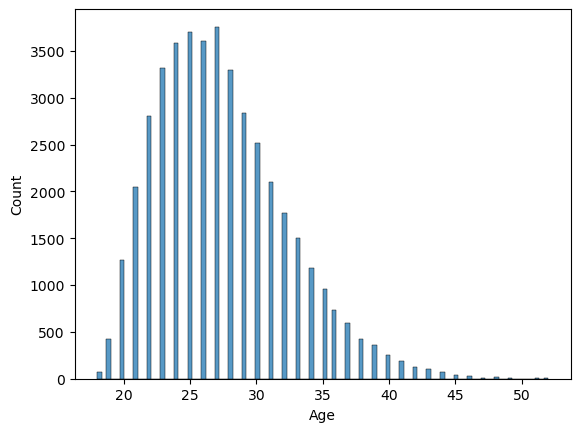

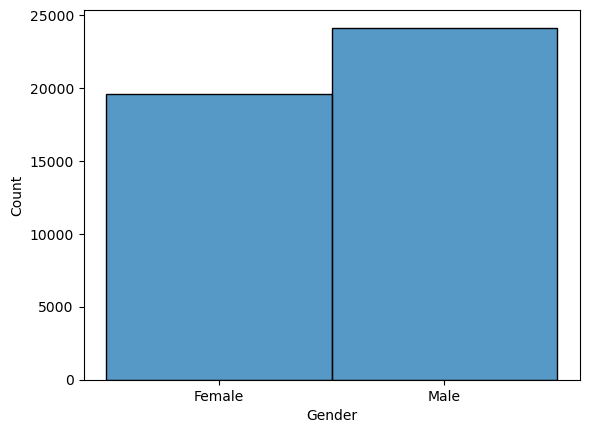

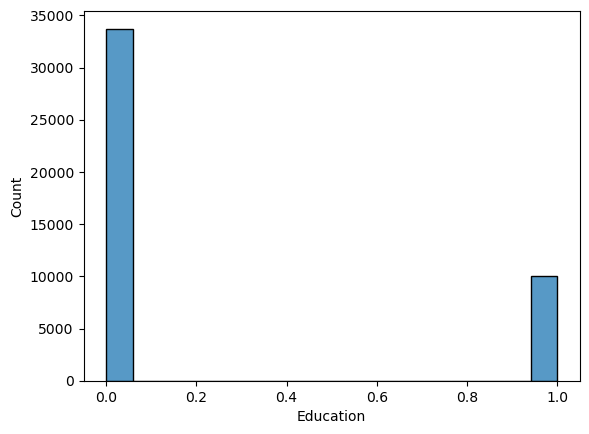

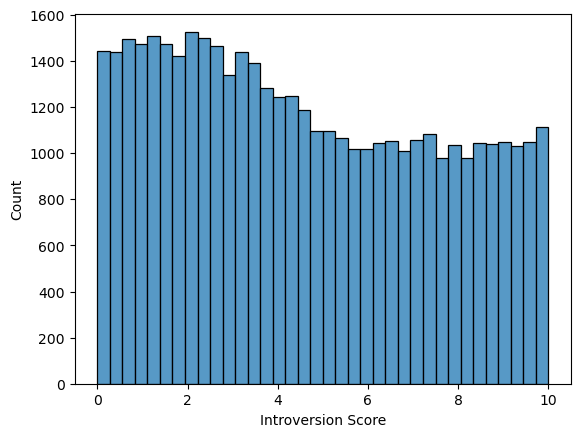

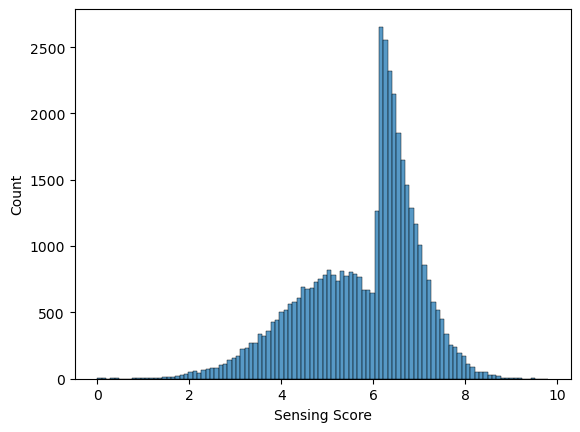

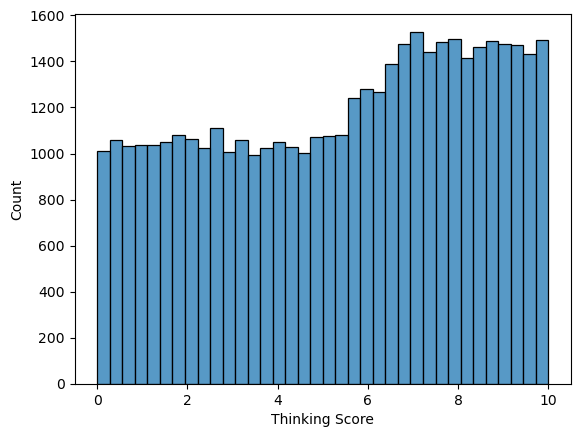

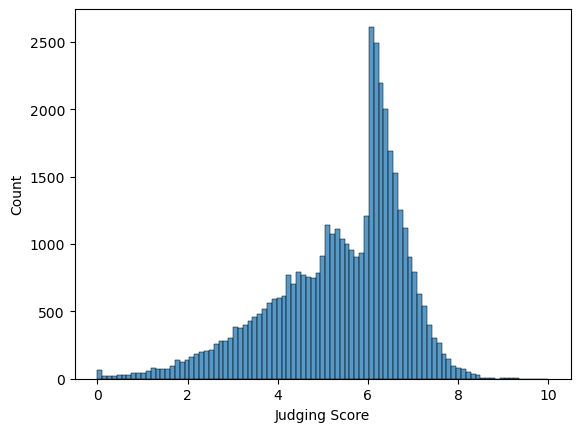

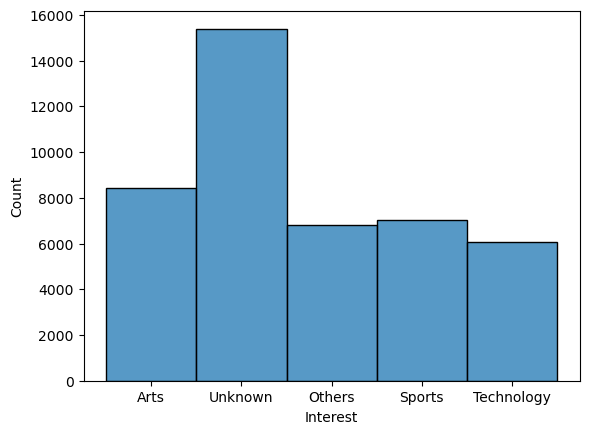

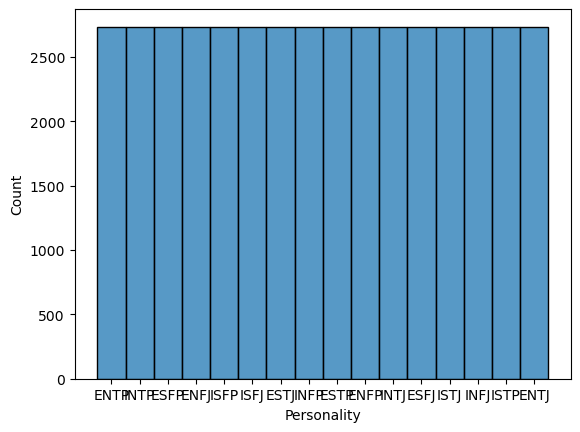

In [45]:
for col in df.columns:
    sns.histplot(df[col])
    plt.show()

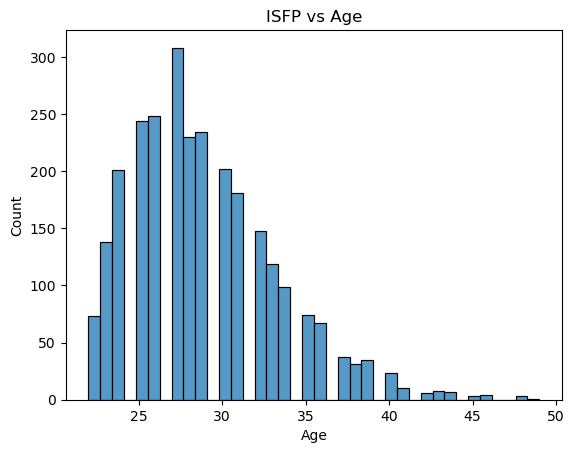

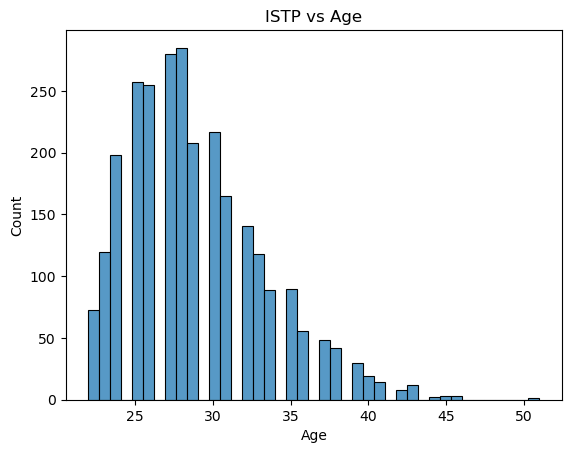

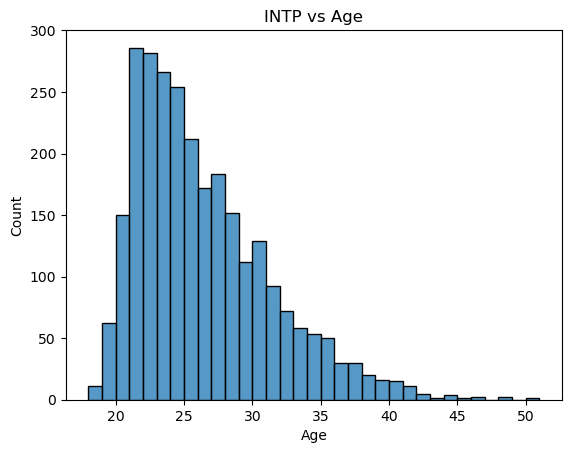

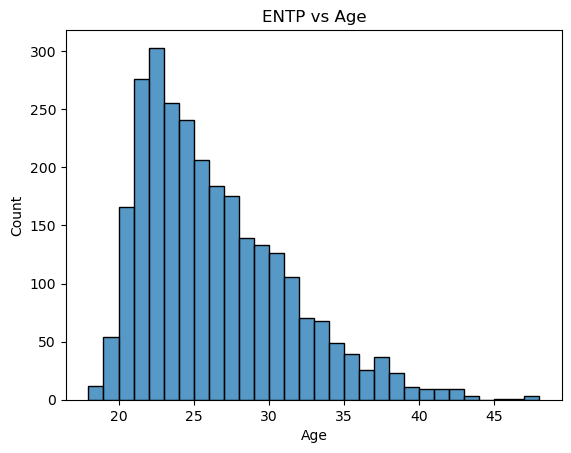

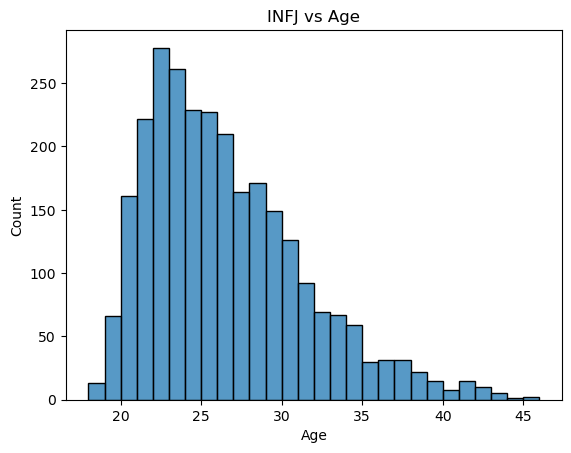

...

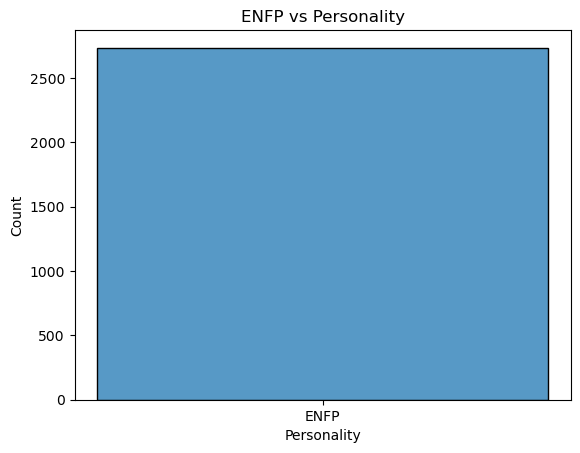

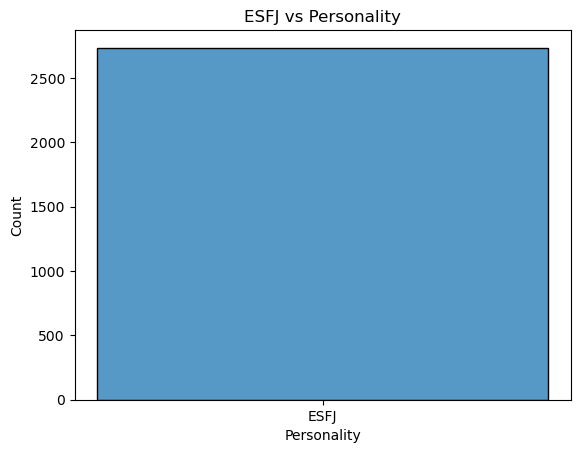

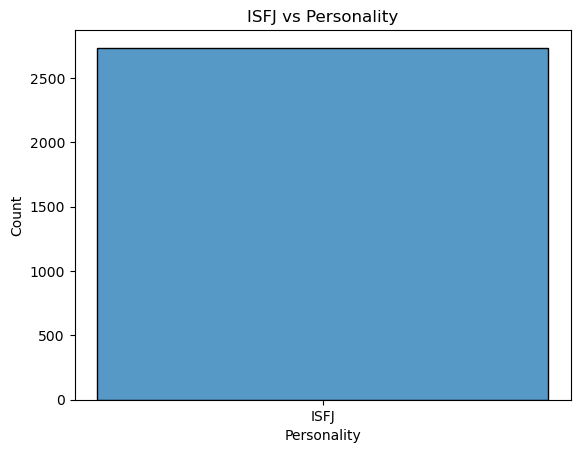

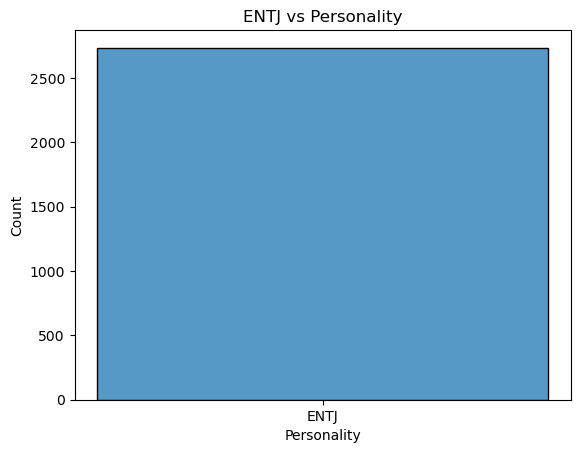

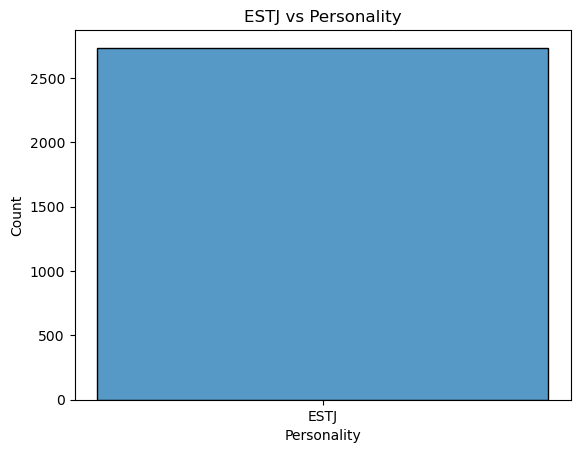

In [222]:
y_list = list(set(y_val))
for col in df.columns:
    for y_l in y_list:
        sns.histplot(df[df["Personality"]==y_l][col])
        plt.title("%s vs %s"%(y_l, col))
        plt.savefig("%s vs %s"%(y_l, col))
        plt.show()

In [54]:
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

In [60]:
model = LGBMClassifier()
kfold = KFold(n_splits=500)
cvs = cross_val_score(model, x2, y2, cv=kfold)

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002804 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002527 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000815 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002547 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002661 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001145 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002842 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002908 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002750 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001073 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002588 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002865 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002671 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000940 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000639 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002694 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002898 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000905 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002862 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002761 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002642 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.775341
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002032 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002596 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.775341
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002808 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001018 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.775709
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.775709
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002650 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002538 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.775341
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001878 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002706 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002950 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002880 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002512 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002745 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002931 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002779 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.775709
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.775341
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002717 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.776077
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000966 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002772 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002906 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001067 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.775341
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003027 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.770575
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.776077
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002859 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002687 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774974
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.775341
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.770941
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.774607
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.773139
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.776444
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43656, number of used features: 12
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.774239
[LightGBM] [Info] Start training from score -2.771307
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773872
[LightGBM] [Info] Start training from score -2.772772
[LightGBM] [Info] Start training from score -2.771673
[LightGBM] [Info] Start training from score -2.772039
[LightGBM] [Info] Start training from score -2.773505
[LightGBM] [Info] Start training from score -2.772405
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001156 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001270 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.775364
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000527 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001540 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001244 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000922 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000997 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001642 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001802 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000775 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000855 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.775732
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001357 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770598
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.775364
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001109 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001468 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001152 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001531 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.775364
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000760 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001191 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.770598
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770598
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001069 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001177 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001583 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000974 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770598
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001640 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001217 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001024 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001509 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000771 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001755 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001875 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001464 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001065 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001033 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002829 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001144 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001759 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001322 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001421 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001551 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001765 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001797 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001339 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001874 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001084 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.770598
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001784 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774997
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000810 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001292 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001429 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001564 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001264 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000891 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001381 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001891 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001602 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001621 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002982 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770598
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.774262
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001798 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000521 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771330
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.773895
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.774629
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001107 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 43657, number of used features: 12
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.771696
[LightGBM] [Info] Start training from score -2.772795
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.770964
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.773162
[LightGBM] [Info] Start training from score -2.773528
[LightGBM] [Info] Start training from score -2.772062
[LightGBM] [Info] Start training from score -2.772428
[LightGBM] [Info] Start tra

In [62]:
cvs

array([0.89772727, 0.92045455, 0.88636364, 0.94318182, 0.86363636,
       0.875     , 0.88636364, 0.88636364, 0.93181818, 0.81818182,
       0.94318182, 0.875     , 0.94318182, 0.93181818, 0.93181818,
       0.89772727, 0.86363636, 0.90909091, 0.875     , 0.88636364,
       0.88636364, 0.90909091, 0.92045455, 0.89772727, 0.90909091,
       0.89772727, 0.89772727, 0.93181818, 0.93181818, 0.89772727,
       0.89772727, 0.90909091, 0.97727273, 0.90909091, 0.90909091,
       0.88636364, 0.89772727, 0.88636364, 0.92045455, 0.875     ,
       0.92045455, 0.89772727, 0.85227273, 0.88636364, 0.86363636,
       0.90909091, 0.875     , 0.875     , 0.89772727, 0.93181818,
       0.84090909, 0.86363636, 0.85227273, 0.94318182, 0.93181818,
       0.85227273, 0.80681818, 0.86363636, 0.88636364, 0.86363636,
       0.92045455, 0.88636364, 0.84090909, 0.89772727, 0.93181818,
       0.86363636, 0.875     , 0.86363636, 0.86363636, 0.86363636,
       0.90909091, 0.89772727, 0.93181818, 0.92045455, 0.84090

In [64]:
df_cvs = pd.DataFrame(cvs)
df_cvs.columns = ["cross_validation"]

In [66]:
df_cvs.describe()

,cross_validation
count,500.000000
mean,0.895525
std,0.032741
min,0.806818
25%,0.873563
50%,0.896552
75%,0.919540
max,0.988506


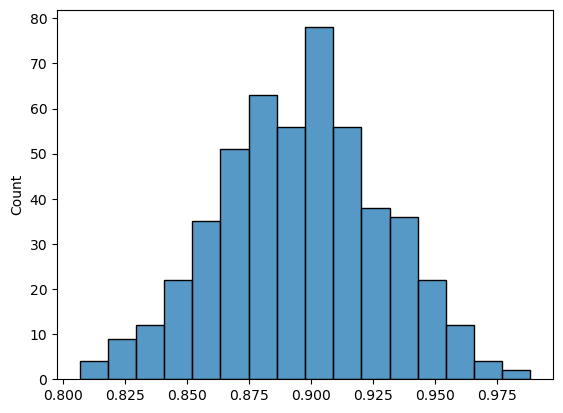

In [72]:
sns.histplot(cvs)
plt.show()

In [98]:
from sklearn.model_selection import train_test_split as tts
x_train, x_test, y_train, y_test = tts(x2, y2, test_size=0.1)
model = LGBMClassifier()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)
inv = {}
for col in dic:
    inv[col] = dic[col]
print(classification_report(y_test, y_pred, target_names=list(inv)))

C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:97: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\decar\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1069
[LightGBM] [Info] Number of data points in the train set: 39369, number of used features: 12
[LightGBM] [Info] Start training from score -2.774445
[LightGBM] [Info] Start training from score -2.774038
[LightGBM] [Info] Start training from score -2.761902
[LightGBM] [Info] Start training from score -2.776891
[LightGBM] [Info] Start training from score -2.768761
[LightGBM] [Info] Start training from score -2.772005
[LightGBM] [Info] Start training from score -2.766738
[LightGBM] [Info] Start training from score -2.769976
[LightGBM] [Info] Start training from score -2.787147
[LightGBM] [Info] Start training from score -2.779343
[LightGBM] [Info] Start training from score -2.767547
[LightGBM] [Info] Start training from

In [100]:
list(inv)

['ISFP',
 'ISTP',
 'INTP',
 'ENTP',
 'INFJ',
 'ESTP',
 'ESFP',
 'ENFJ',
 'INFP',
 'INTJ',
 'ISTJ',
 'ENFP',
 'ESFJ',
 'ISFJ',
 'ENTJ',
 'ESTJ']

In [102]:
from sklearn.metrics import confusion_matrix as cm
df_cm = pd.DataFrame(cm(y_test, y_pred))
df_cm.columns = list(inv)
df_cm.index = list(inv)
df_cm

,ISFP,ISTP,INTP,ENTP,INFJ,ESTP,ESFP,ENFJ,INFP,INTJ,ISTJ,ENFP,ESFJ,ISFJ,ENTJ,ESTJ
ISFP,252,0,0,0,0,0,22,0,4,0,0,0,0,0,0,0
ISTP,1,259,1,0,0,15,0,0,0,0,1,0,0,0,0,0
INTP,0,12,217,15,0,0,0,0,2,1,0,0,0,0,0,0
ENTP,0,0,32,240,0,12,0,0,0,0,0,0,0,0,0,0
INFJ,0,0,0,0,230,0,0,18,1,1,0,0,0,14,0,0
ESTP,0,20,0,5,0,246,1,0,0,0,0,0,0,0,0,0
ESFP,31,0,0,0,0,0,225,0,0,0,0,3,0,0,0,0
ENFJ,0,0,0,0,16,0,0,238,0,1,0,0,9,2,1,0
INFP,17,0,1,0,0,0,1,0,267,0,0,23,0,0,0,0
INTJ,0,0,3,0,1,0,0,0,0,252,15,0,1,0,18,0


平均的な正解率の時、基本的には内向的か外向的かで間違えやすいが、それ以外だとS(感覚型)かN(直感型)かで間違えやすい

In [104]:
df_cm.to_csv("MBTI_matrix.csv", encoding="shift-jis")

In [366]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
def biplot_spv(df, y):
    for col in df.columns:
        df[col] = (df[col] - df[col].mean()) / df[col].std()
    model = PCA()
    model.fit(df)
    df_pc = model.transform(df)
    com = model.components_
    evr = model.explained_variance_ratio_
    fac = []
    ind = []
    for i in range(len(evr)):
        fac.append(np.sqrt(model.explained_variance_ratio_)[i] * model.components_[i])
        ind.append("PC%d"%(i+1))
    df_fac = pd.DataFrame(fac)
    df_fac.columns = df.columns
    df_fac.index = ind
    df_fac.to_csv("factor_1.csv", encoding="shift-jis")
    fig, ax1 = plt.subplots()
    ax2 = ax1.twinx()
    ax2.scatter(df_pc[:, 0], df_pc[:, 1], cmap="brg", c=y)
    ax3 = ax1.twiny()
    ylim = [abs(max(fac[1])), abs(min(fac[1]))]
    xlim = [abs(max(fac[0])), abs(min(fac[0]))]
    for i in range(len(df.columns)):
        ax3.plot([0, fac[0][i]], [0, fac[1][i]], color="#FF0000")
        ax3.text(fac[0][i], fac[1][i], df.columns[i])
    ax3.set_xlim(-max(xlim), max(xlim))
    ax3.set_ylim(-max(ylim), max(ylim))
    plt.show()

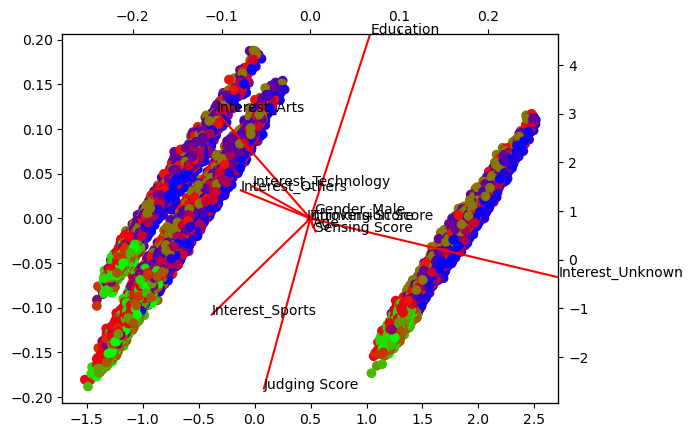

In [368]:
biplot_spv(x2, y2.values)

biplotで可視化した結果3つのクラスタに分かれていることが分かった

In [125]:
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
ss = StandardScaler()
ss.fit(x2)
x3 = ss.transform(x2)
pca = PCA()
pca.fit(x3)
tx = pca.transform(x3)

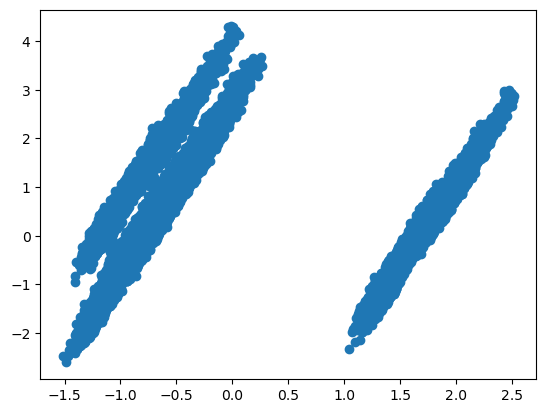

In [127]:
plt.scatter(tx[:, 0], tx[:, 1])
plt.show()

In [135]:
df_tx = pd.DataFrame(tx)
columns = []
for i in range(len(df_tx.columns)):
    columns.append("PC%d"%(i+1))
df_tx.columns = columns
df_tx

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,-0.630744,2.180915,-1.808939,-1.264603,-1.623333,-1.776749,0.014248,1.309873,0.404547,1.245218,1.244071,-2.775558e-16
1,2.047255,1.483970,0.125334,-1.260287,-0.455581,-1.562031,-0.840256,1.376987,-0.340204,1.024383,0.475689,-1.110223e-16
2,-0.422761,1.365485,1.839890,1.292822,-0.511734,-0.656408,1.328105,0.891788,-0.082567,-0.583263,1.323064,6.661338e-16
3,-1.094680,-1.004265,0.044173,-0.890930,1.303029,-1.435912,0.482780,-1.276827,-0.119932,1.272066,-0.273589,-1.110223e-16
4,-0.682961,0.576884,1.798575,1.689807,-0.249437,-0.310994,0.254103,1.003755,-0.743729,0.194905,-1.242787,6.661338e-16
...,...,...,...,...,...,...,...,...,...,...,...,...
43739,-0.553731,2.121302,-1.488079,0.056747,-0.227630,-0.342535,0.064620,-0.251741,2.103016,0.317114,1.154925,-3.330669e-16
43740,1.668146,-0.044035,-0.057915,0.437149,0.678360,0.244705,0.458412,-1.579656,-1.267160,-0.536925,-1.249444,-1.110223e-16
43741,-0.868009,-0.344281,0.683174,-1.529954,-0.564497,1.977846,-0.637487,1.094826,-0.770205,-0.839723,-0.044472,1.110223e-16
43742,-0.957656,0.957946,-1.946372,-0.138865,-0.884274,-0.609352,0.915775,-1.190106,0.368083,-0.170398,-0.815420,-3.330669e-16


In [149]:
np.cumsum(pca.explained_variance_ratio_)

array([0.11916586, 0.23092352, 0.33191138, 0.43022671, 0.5273585 ,
       0.62364544, 0.70767229, 0.79101002, 0.87353924, 0.94291971,
       1.        , 1.        ])

In [151]:
df_tx[["PC1", "PC2"]]

,PC1,PC2
0,-0.630744,2.180915
1,2.047255,1.483970
2,-0.422761,1.365485
3,-1.094680,-1.004265
4,-0.682961,0.576884
...,...,...
43739,-0.553731,2.121302
43740,1.668146,-0.044035
43741,-0.868009,-0.344281
43742,-0.957656,0.957946


In [171]:
model4 = GaussianMixture(n_components=3)
model4.fit(df_tx[["PC1", "PC2", "PC3"]])
y_pred = model4.predict(df_tx[["PC1", "PC2", "PC3"]])

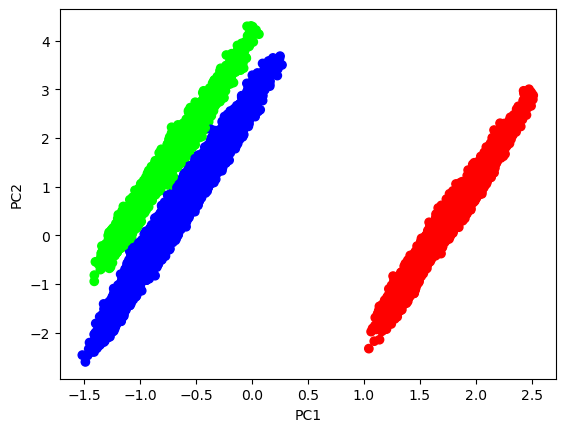

In [209]:
plt.scatter(df_tx["PC1"], df_tx["PC2"], c=y_pred, cmap="brg")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

In [181]:
df_pred = pd.DataFrame(y_pred)
df_pred.columns = ["GMM"]
df_tx = pd.concat([df_tx, df_pred], axis=1)
df_tx

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,GMM
0,-0.630744,2.180915,-1.808939,-1.264603,-1.623333,-1.776749,0.014248,1.309873,0.404547,1.245218,1.244071,-2.775558e-16,2
1,2.047255,1.483970,0.125334,-1.260287,-0.455581,-1.562031,-0.840256,1.376987,-0.340204,1.024383,0.475689,-1.110223e-16,1
2,-0.422761,1.365485,1.839890,1.292822,-0.511734,-0.656408,1.328105,0.891788,-0.082567,-0.583263,1.323064,6.661338e-16,0
3,-1.094680,-1.004265,0.044173,-0.890930,1.303029,-1.435912,0.482780,-1.276827,-0.119932,1.272066,-0.273589,-1.110223e-16,0
4,-0.682961,0.576884,1.798575,1.689807,-0.249437,-0.310994,0.254103,1.003755,-0.743729,0.194905,-1.242787,6.661338e-16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43739,-0.553731,2.121302,-1.488079,0.056747,-0.227630,-0.342535,0.064620,-0.251741,2.103016,0.317114,1.154925,-3.330669e-16,2
43740,1.668146,-0.044035,-0.057915,0.437149,0.678360,0.244705,0.458412,-1.579656,-1.267160,-0.536925,-1.249444,-1.110223e-16,1
43741,-0.868009,-0.344281,0.683174,-1.529954,-0.564497,1.977846,-0.637487,1.094826,-0.770205,-0.839723,-0.044472,1.110223e-16,0
43742,-0.957656,0.957946,-1.946372,-0.138865,-0.884274,-0.609352,0.915775,-1.190106,0.368083,-0.170398,-0.815420,-3.330669e-16,2


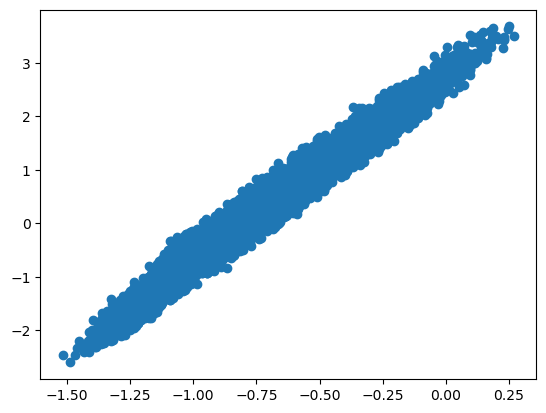

In [203]:
tx0 = df_tx[df_tx["GMM"]==0]
plt.scatter(tx0["PC1"], tx0["PC2"])

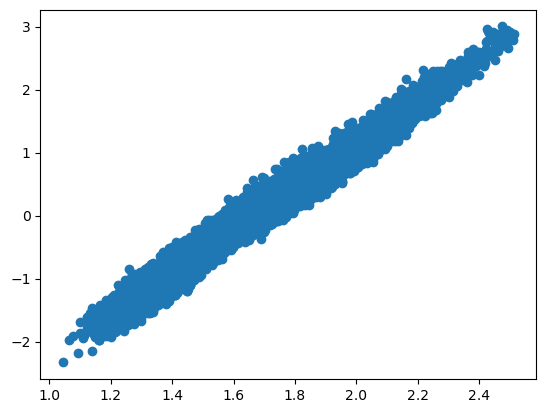

In [205]:
tx0 = df_tx[df_tx["GMM"]==1]
plt.scatter(tx0["PC1"], tx0["PC2"])

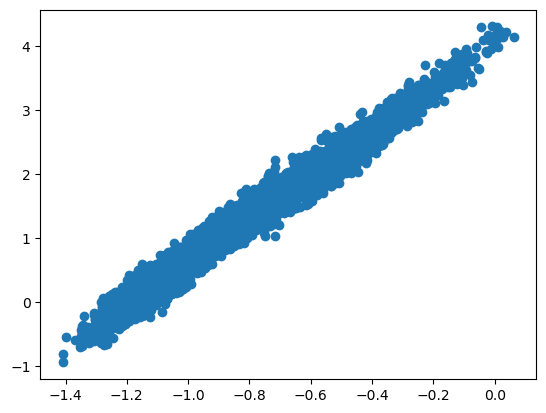

In [207]:
tx0 = df_tx[df_tx["GMM"]==2]
plt.scatter(tx0["PC1"], tx0["PC2"])

In [214]:
df_GMM = pd.concat([df_tx["GMM"], df], axis=1)
df_GMM

,GMM,Age,Gender,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Interest,Personality
0,2,21.0,Female,1,5.89208,2.144395,7.32363,5.462224,Arts,ENTP
1,1,24.0,Female,1,2.48366,3.206188,8.06876,3.765012,Unknown,INTP
2,0,26.0,Female,1,7.02910,6.469302,4.16472,5.454442,Others,ESFP
3,0,30.0,Male,0,5.46525,4.179244,2.82487,5.080477,Sports,ENFJ
4,0,31.0,Female,0,3.59804,6.189259,5.31347,3.677984,Others,ISFP
...,...,...,...,...,...,...,...,...,...,...
43739,2,26.0,Male,1,8.88656,5.118399,8.48784,5.331942,Arts,ENTP
43740,1,29.0,Male,0,2.71470,6.851956,0.25519,3.623678,Unknown,ISFP
43741,0,25.0,Female,0,2.00982,6.544036,6.63911,6.201555,Technology,ISTJ
43742,2,23.0,Male,0,7.23553,4.876780,2.41671,4.654016,Arts,ENFP


In [228]:
model5 = LGBMClassifier()
y5 = df_GMM["GMM"]
x5 = df_GMM.drop("GMM", axis=1)
x6 = pd.get_dummies(x5)
x6

,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Gender_Female,Gender_Male,Interest_Arts,Interest_Others,...,Personality_ESTJ,Personality_ESTP,Personality_INFJ,Personality_INFP,Personality_INTJ,Personality_INTP,Personality_ISFJ,Personality_ISFP,Personality_ISTJ,Personality_ISTP
0,21.0,1,5.89208,2.144395,7.32363,5.462224,True,False,True,False,...,False,False,False,False,False,False,False,False,False,False
1,24.0,1,2.48366,3.206188,8.06876,3.765012,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
2,26.0,1,7.02910,6.469302,4.16472,5.454442,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
3,30.0,0,5.46525,4.179244,2.82487,5.080477,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
4,31.0,0,3.59804,6.189259,5.31347,3.677984,True,False,False,True,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43739,26.0,1,8.88656,5.118399,8.48784,5.331942,False,True,True,False,...,False,False,False,False,False,False,False,False,False,False
43740,29.0,0,2.71470,6.851956,0.25519,3.623678,False,True,False,False,...,False,False,False,False,False,False,False,True,False,False
43741,25.0,0,2.00982,6.544036,6.63911,6.201555,True,False,False,False,...,False,False,False,False,False,False,False,False,True,False
43742,23.0,0,7.23553,4.876780,2.41671,4.654016,False,True,True,False,...,False,False,False,False,False,False,False,False,False,False


In [232]:
x6 = x6.drop("Gender_Female", axis=1)

In [240]:
x_train, x_test, y_train, y_test = tts(x6, y5, test_size=0.5)
model5.fit(x_train, y_train)
y_pred = model5.predict(x_test)
print(classification_report(y_test, y_pred))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001399 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1100
[LightGBM] [Info] Number of data points in the train set: 21872, number of used features: 28
[LightGBM] [Info] Start training from score -0.796113
[LightGBM] [Info] Start training from score -1.035323
[LightGBM] [Info] Start training from score -1.640880
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [262]:
imp2 = model5.feature_importances_
df_imp2 = pd.DataFrame(imp2/sum(imp2))
df_imp2.index = x6.columns

In [264]:
df_imp2.columns= ["imp"]
df_imp2.sort_values("imp", ascending=False)

,imp
Age,0.297986
Introversion Score,0.262228
Interest_Arts,0.122894
Interest_Unknown,0.122072
Sensing Score,0.104809
Thinking Score,0.045212
Judging Score,0.040691
Education,0.003288
Interest_Sports,0.000411
Interest_Others,0.000411


In [340]:
pca = PCA()
pca.fit(x6)
evr = pca.explained_variance_ratio_
com = pca.components_

In [342]:
evr

array([5.15701102e-01, 1.83407753e-01, 1.80295780e-01, 4.57899672e-02,
       3.28017264e-02, 6.18535052e-03, 5.34216467e-03, 4.06241125e-03,
       3.65253820e-03, 3.21418135e-03, 3.03578024e-03, 1.34289379e-03,
       1.34289379e-03, 1.34289379e-03, 1.34289379e-03, 1.34283916e-03,
       1.34276577e-03, 1.34267429e-03, 1.34259778e-03, 1.34204528e-03,
       1.34182457e-03, 1.34154967e-03, 5.55846402e-04, 4.41632358e-04,
       3.98158257e-04, 3.47736949e-04, 1.01704110e-31, 5.21398815e-34])

In [348]:
fac = []
for i in range(3):
        fac.append(np.sqrt(evr)[i] * com[i])
df_fac = pd.DataFrame(fac)
ind = []
for i in range(3):
    ind.append("PC%d"%(i+1))
df_fac.columns = x6.columns
df_fac.index = ind
df_fac.to_csv("factor.csv", encoding="shift-jis")
df_fac

,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Gender_Male,Interest_Arts,Interest_Others,Interest_Sports,...,Personality_ESTJ,Personality_ESTP,Personality_INFJ,Personality_INFP,Personality_INTJ,Personality_INTP,Personality_ISFJ,Personality_ISFP,Personality_ISTJ,Personality_ISTP
PC1,0.717277,0.000124,-0.005780,0.032435,-0.001040,0.001291,0.000232,-0.000278,0.000420,-0.000086,...,0.002778,0.002608,-0.002675,-0.002507,-0.002744,-0.002904,0.002932,0.002883,0.002990,0.002909
PC2,0.002138,-0.000122,0.309897,-0.001280,-0.293939,0.000547,-0.000219,0.000378,-0.000319,0.000032,...,0.000192,0.000098,-0.000186,-0.000143,-0.010942,-0.010927,-0.000225,-0.000164,-0.011128,-0.011028
PC3,-0.002715,-0.000175,-0.291464,-0.002070,-0.307229,-0.001199,0.000299,0.000530,-0.000234,-0.000064,...,-0.010935,-0.010654,0.011046,0.010894,-0.000410,-0.000354,0.010750,0.010602,-0.000542,-0.000413


In [288]:
df_GMM[df_GMM["GMM"]==0].describe()

,GMM,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score
count,19898.0,19898.000000,19898.000000,19898.000000,19898.000000,19898.000000,19898.000000
mean,0.0,27.453061,0.206202,4.602205,5.776270,5.447628,5.407158
std,0.0,4.893994,0.404587,2.901196,1.244287,2.898940,1.386714
min,0.0,18.000000,0.000000,0.000300,0.129360,0.000750,0.000000
25%,0.0,24.000000,0.000000,2.072577,4.948867,2.933612,4.668268
50%,0.0,27.000000,0.000000,4.302935,6.164222,5.837430,5.678855
75%,0.0,30.000000,0.000000,7.107130,6.619807,7.931440,6.360778
max,0.0,52.000000,1.000000,9.999920,9.803837,9.999770,9.730436


In [290]:
df_GMM[df_GMM["GMM"]==1].describe()

,GMM,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score
count,15396.0,15396.000000,15396.000000,15396.000000,15396.000000,15396.000000,15396.000000
mean,1.0,27.442647,0.244739,4.575054,5.791372,5.419282,5.382243
std,0.0,4.907924,0.429946,2.908588,1.230924,2.912914,1.487554
min,1.0,18.000000,0.000000,0.000470,0.000000,0.000320,0.000000
25%,1.0,24.000000,0.000000,2.066770,4.962865,2.879290,4.417614
50%,1.0,27.000000,0.000000,4.225940,6.163977,5.764340,5.914113
75%,1.0,30.000000,0.000000,7.083180,6.633487,7.972565,6.445249
max,1.0,52.000000,1.000000,9.999260,9.497397,9.999690,10.000000


In [292]:
df_GMM[df_GMM["GMM"]==2].describe()

,GMM,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score
count,8450.0,8450.000000,8450.000000,8450.000000,8450.000000,8450.000000,8450.000000
mean,2.0,27.389941,0.254083,4.579942,5.768447,5.351749,5.369119
std,0.0,4.867813,0.435370,2.895320,1.254800,2.882156,1.486580
min,2.0,18.000000,0.000000,0.000150,0.000000,0.001220,0.000000
25%,2.0,24.000000,0.000000,2.058203,4.945869,2.850925,4.411453
50%,2.0,27.000000,0.000000,4.232060,6.156402,5.662995,5.881810
75%,2.0,30.000000,1.000000,7.038258,6.611069,7.810305,6.435955
max,2.0,51.000000,1.000000,9.999760,9.153474,9.999720,9.191211


In [294]:
df_GMM = df_GMM.replace(True, 1)
df_GMM = df_GMM.replace(False, 0)
df_GMM

,GMM,Age,Gender,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Interest,Personality
0,2,21.0,Female,1,5.89208,2.144395,7.32363,5.462224,Arts,ENTP
1,1,24.0,Female,1,2.48366,3.206188,8.06876,3.765012,Unknown,INTP
2,0,26.0,Female,1,7.02910,6.469302,4.16472,5.454442,Others,ESFP
3,0,30.0,Male,0,5.46525,4.179244,2.82487,5.080477,Sports,ENFJ
4,0,31.0,Female,0,3.59804,6.189259,5.31347,3.677984,Others,ISFP
...,...,...,...,...,...,...,...,...,...,...
43739,2,26.0,Male,1,8.88656,5.118399,8.48784,5.331942,Arts,ENTP
43740,1,29.0,Male,0,2.71470,6.851956,0.25519,3.623678,Unknown,ISFP
43741,0,25.0,Female,0,2.00982,6.544036,6.63911,6.201555,Technology,ISTJ
43742,2,23.0,Male,0,7.23553,4.876780,2.41671,4.654016,Arts,ENFP


{'whiskers': [<matplotlib.lines.Line2D at 0x24df2684200>,
 'caps': [<matplotlib.lines.Line2D at 0x24df26c21e0>,
 'boxes': [<matplotlib.lines.Line2D at 0x24df26867b0>],
 'medians': [<matplotlib.lines.Line2D at 0x24df26c1910>],
 'fliers': [<matplotlib.lines.Line2D at 0x24df26c23f0>],
 'means': []}

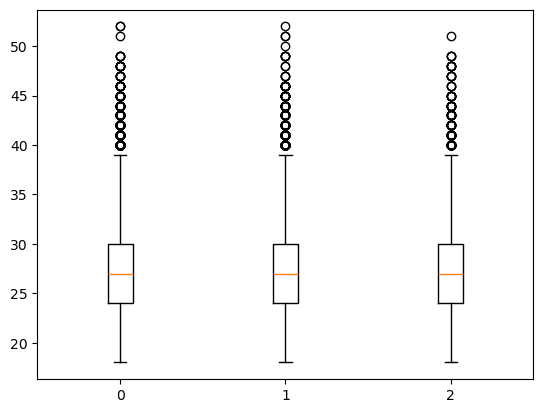

In [302]:
plt.boxplot(df_GMM[df_GMM["GMM"]==0]["Age"], positions=[0])
plt.boxplot(df_GMM[df_GMM["GMM"]==1]["Age"], positions=[1])
plt.boxplot(df_GMM[df_GMM["GMM"]==2]["Age"], positions=[2])

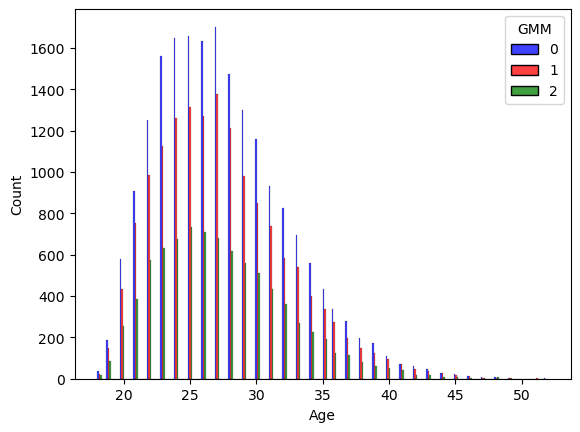

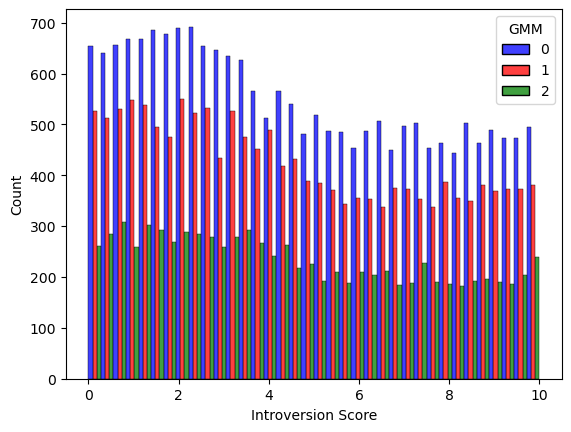

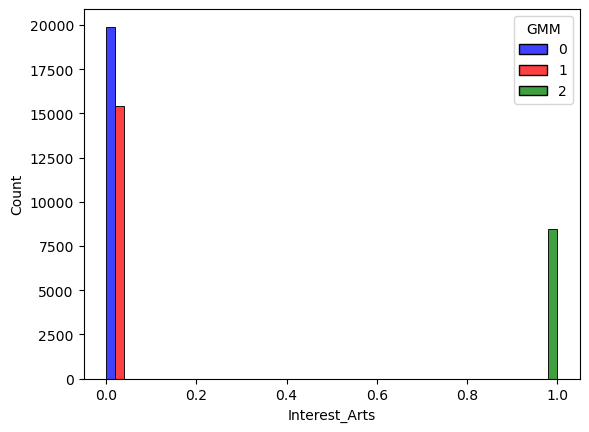

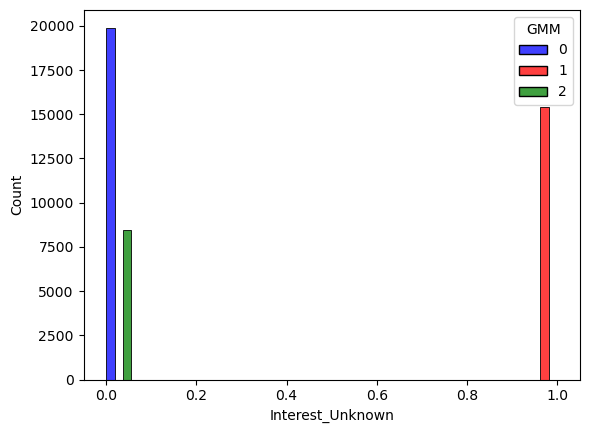

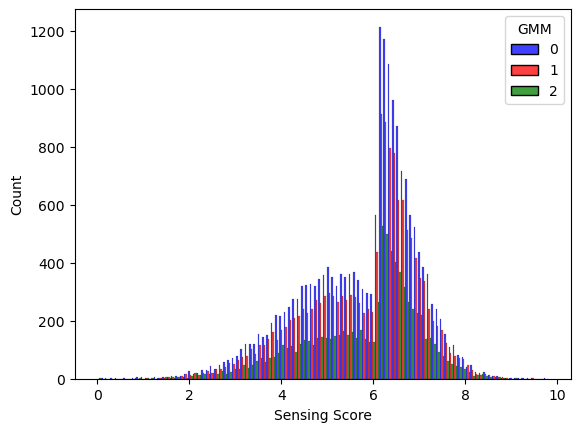

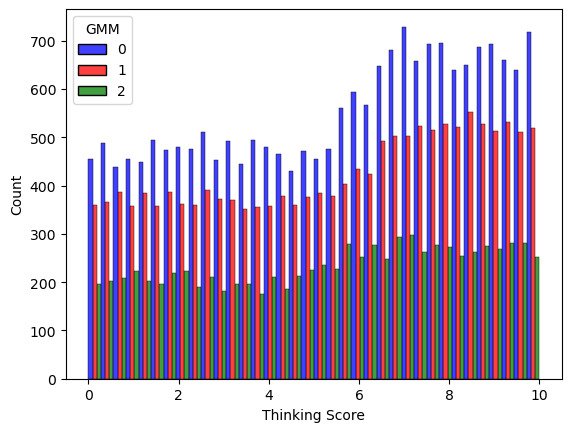

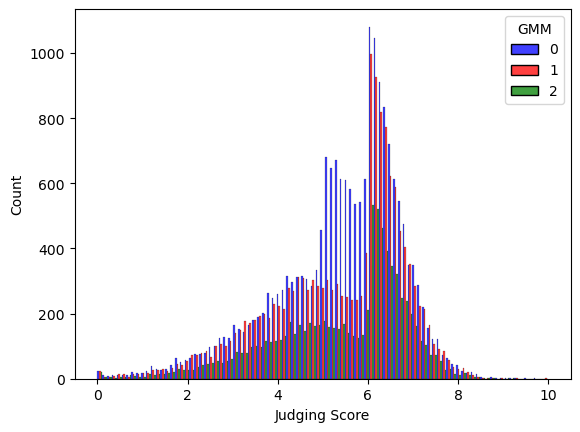

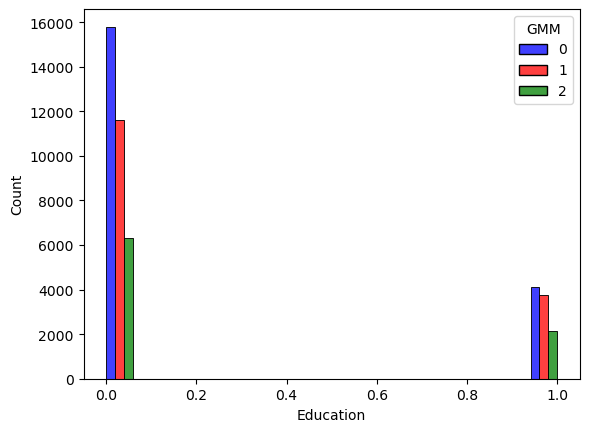

In [378]:
columns = ["Age", "Introversion Score", "Interest_Arts", "Interest_Unknown", "Sensing Score", "Thinking Score", "Judging Score", "Education"]
for col in columns:
    sns.histplot(x6, x=col, multiple="dodge", hue=df_GMM["GMM"], palette={0:"blue", 1:"red", 2:"green"})
    plt.savefig("factor/"+col)
    plt.show()

In [338]:
x6

,Age,Education,Introversion Score,Sensing Score,Thinking Score,Judging Score,Gender_Male,Interest_Arts,Interest_Others,Interest_Sports,...,Personality_ESTJ,Personality_ESTP,Personality_INFJ,Personality_INFP,Personality_INTJ,Personality_INTP,Personality_ISFJ,Personality_ISFP,Personality_ISTJ,Personality_ISTP
0,21.0,1,5.89208,2.144395,7.32363,5.462224,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
1,24.0,1,2.48366,3.206188,8.06876,3.765012,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
2,26.0,1,7.02910,6.469302,4.16472,5.454442,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,30.0,0,5.46525,4.179244,2.82487,5.080477,True,False,False,True,...,False,False,False,False,False,False,False,False,False,False
4,31.0,0,3.59804,6.189259,5.31347,3.677984,False,False,True,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43739,26.0,1,8.88656,5.118399,8.48784,5.331942,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False
43740,29.0,0,2.71470,6.851956,0.25519,3.623678,True,False,False,False,...,False,False,False,False,False,False,False,True,False,False
43741,25.0,0,2.00982,6.544036,6.63911,6.201555,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
43742,23.0,0,7.23553,4.876780,2.41671,4.654016,True,True,False,False,...,False,False,False,False,False,False,False,False,False,False


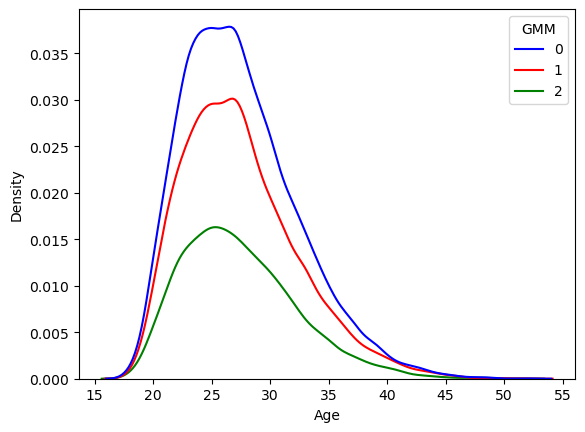

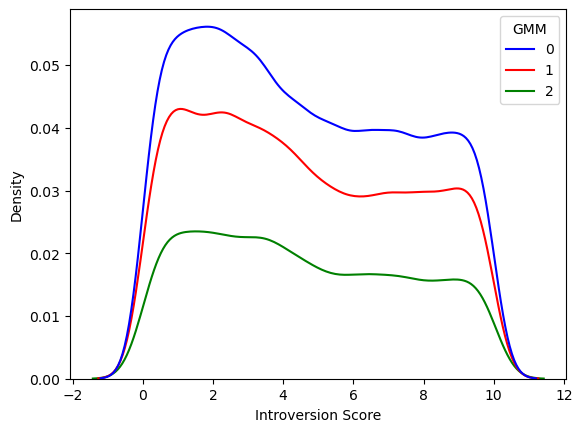

C:\Users\decar\AppData\Local\Temp\ipykernel_18600\3678891233.py:3: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x6, x=col, hue=df_GMM["GMM"], palette={0:"blue", 1:"red", 2:"green"})


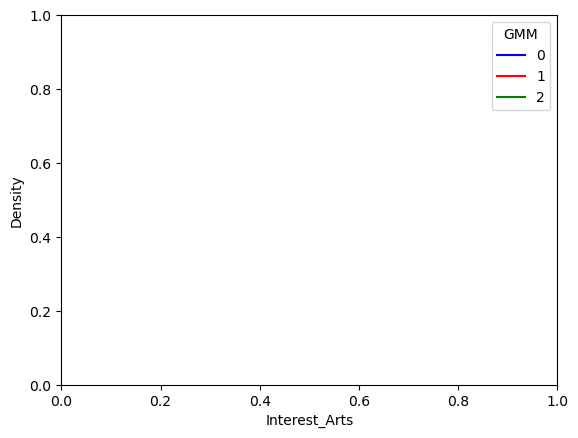

C:\Users\decar\AppData\Local\Temp\ipykernel_18600\3678891233.py:3: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x6, x=col, hue=df_GMM["GMM"], palette={0:"blue", 1:"red", 2:"green"})


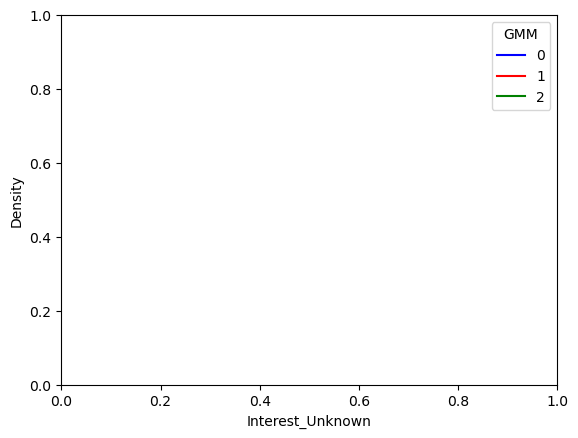

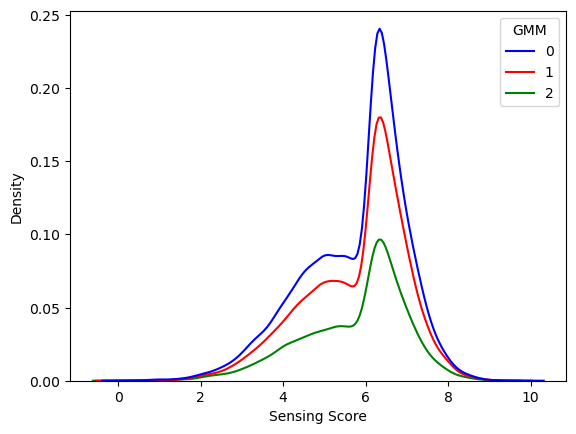

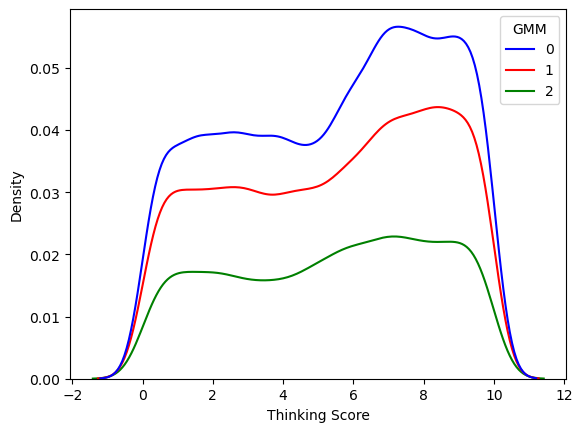

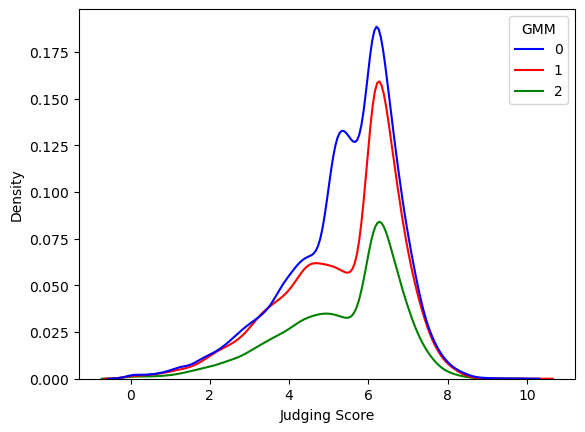

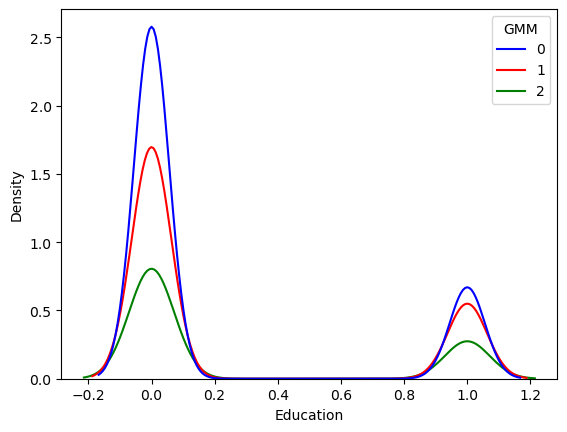

In [376]:
columns = ["Age", "Introversion Score", "Interest_Arts", "Interest_Unknown", "Sensing Score", "Thinking Score", "Judging Score", "Education"]
for col in columns:
    sns.kdeplot(x6, x=col, hue=df_GMM["GMM"], palette={0:"blue", 1:"red", 2:"green"})
    plt.savefig("factor/"+col)
    plt.show()

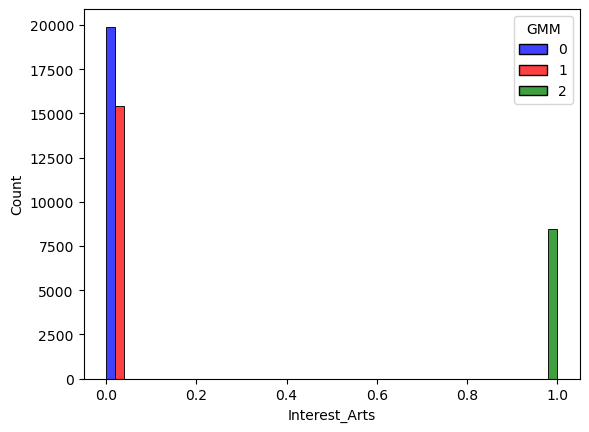

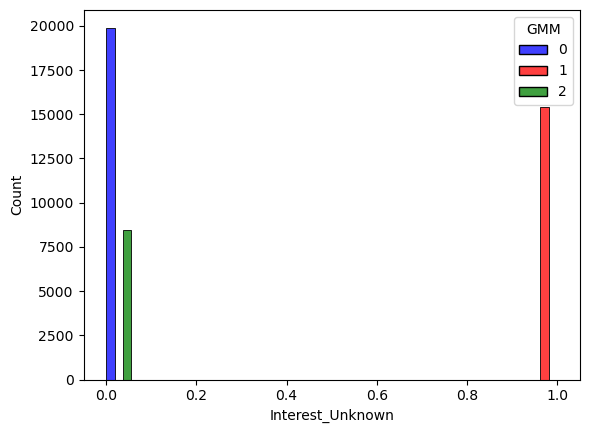

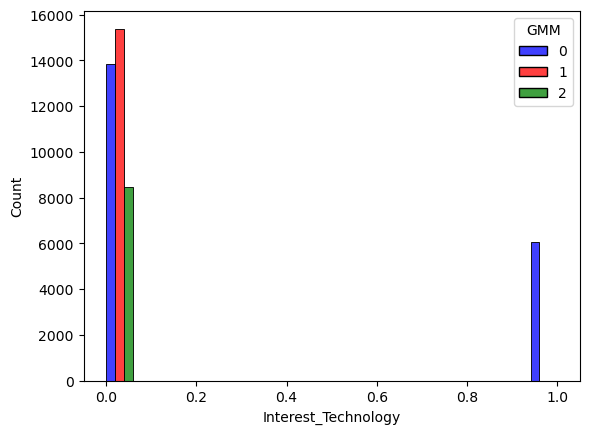

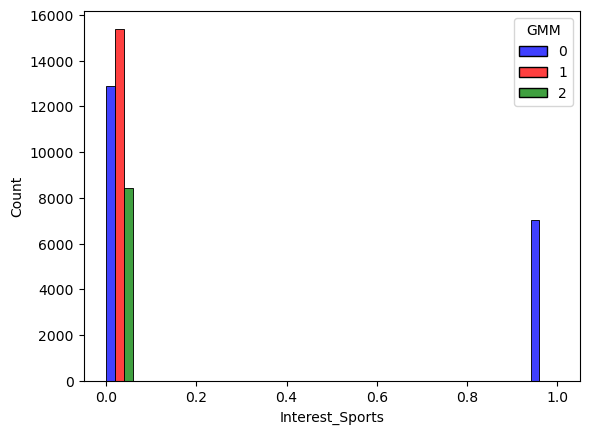

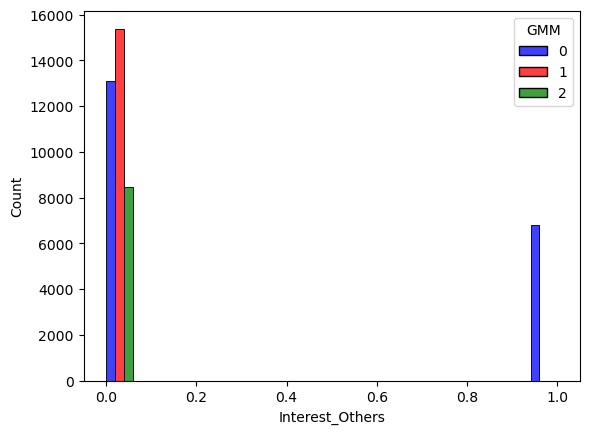

In [380]:
columns = ["Interest_Arts", "Interest_Unknown", "Interest_Technology", "Interest_Sports", "Interest_Others"]
for col in columns:
    sns.histplot(x6, x=col, multiple="dodge", hue=df_GMM["GMM"], palette={0:"blue", 1:"red", 2:"green"})
    # plt.savefig("factor/"+col)
    plt.show()

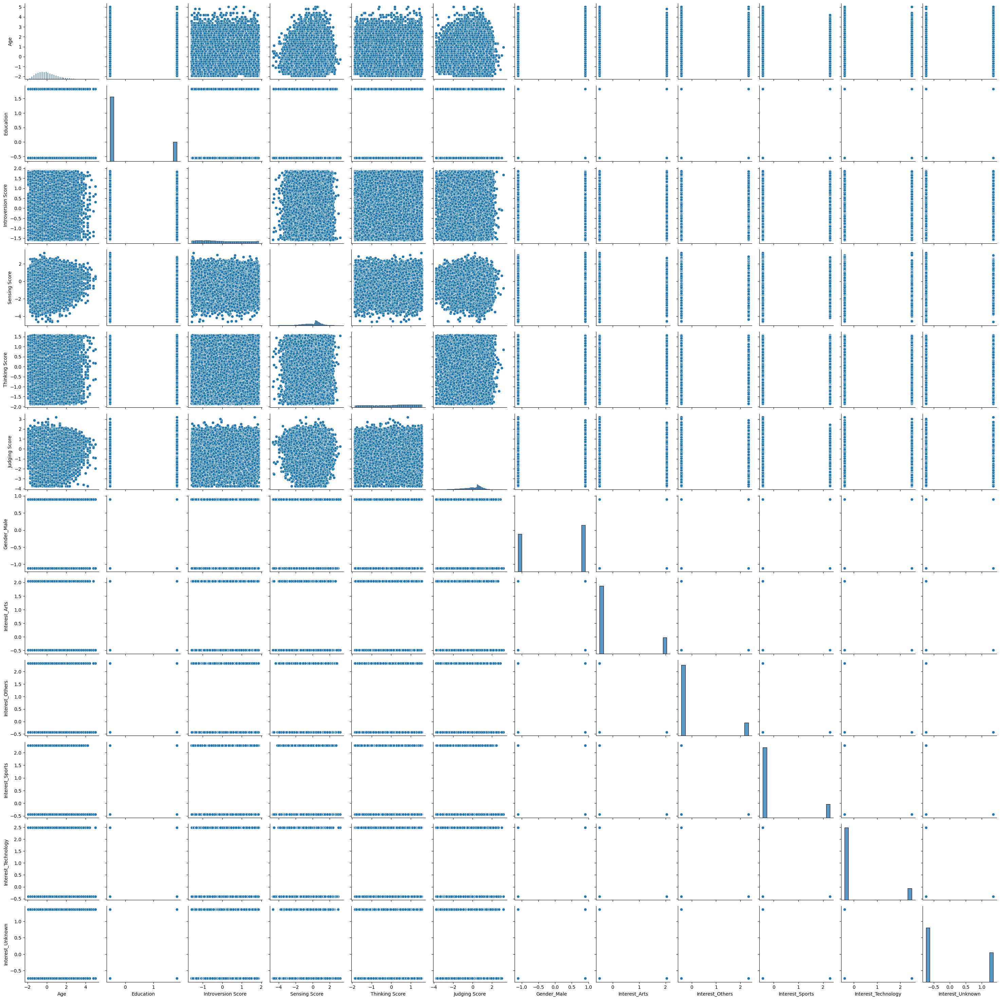

In [384]:
sns.pairplot(x2)

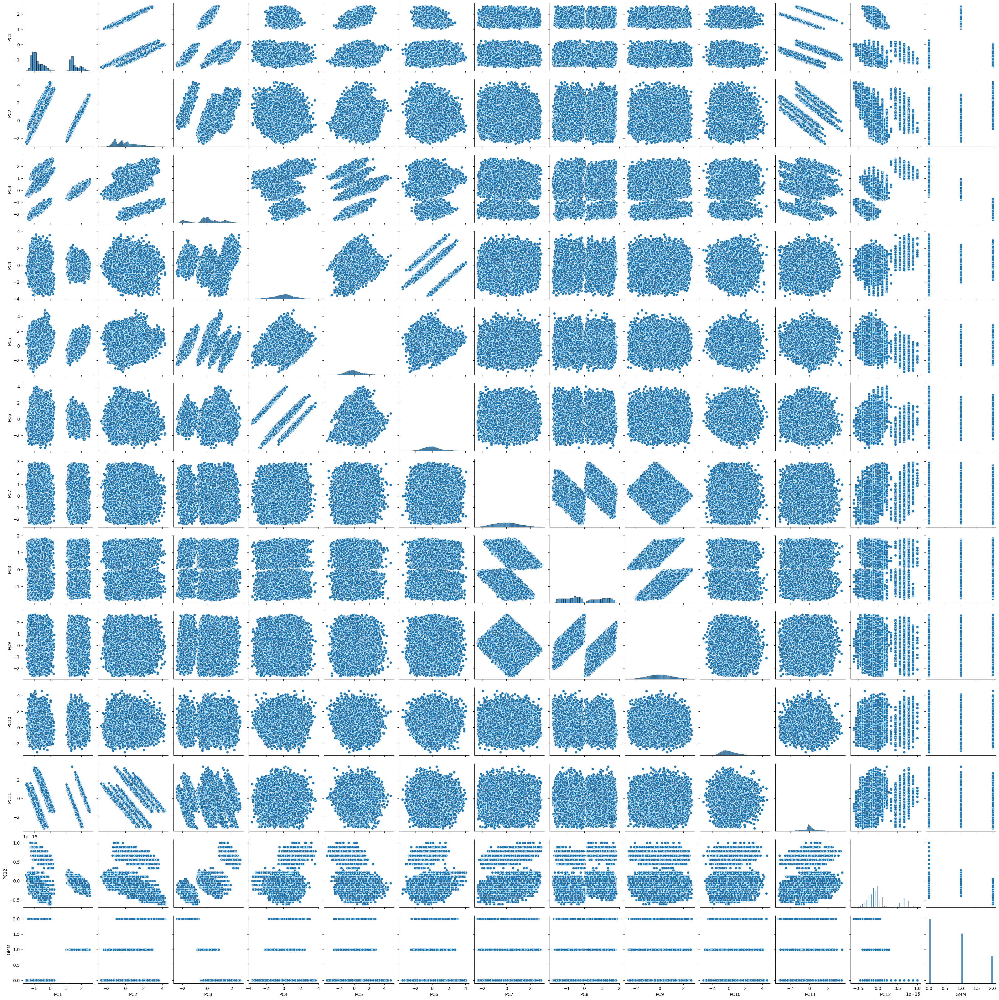

In [386]:
sns.pairplot(df_tx)